# Business Understanding
## Doel van de opdracht
Het van de opdracht is om doormiddel van het lichtspectrum een model training die dan labels kan voorspellen. Doordat het veel data bevat kan door menselijke input fouten worden gemaakt. Door een getraind model zou deze fouten minder moeten voorkomen
## Situatie
We hebben twee datasets ontvangen, een training set. Een labelset en een geanalyseerde set.
## Data mining doelen
Geen, de data hebben we al. Het wordt alleen het analyseren daarvan.
## Project plan
Data analyse van de les uitvoeren op deze datasets.

# Data understanding
De klant heeft `specral_data.pkl` bestand met daarin data van een sateliet. Daarnaast is er ook een `ground_truth.pkl` bestand met labels gerelateerd aan die sateliet data.

In [1]:
import pickle
from random import sample

with open('ground_truth.pkl', 'rb') as f:
    labels = pickle.load(f)[:1000]
    
with open('spectral_data.pkl', 'rb') as f:
    data = pickle.load(f)[:1000]

`ground_truth.pkl:`

`x` = de x-coordinaat op basis van de sateliet

`y` = de y-coordinaat op basis van de sateliet

`category` = het label/grondsoort dat de coordinaat in werkelijkheid heeft.

In [41]:
print(labels)
print(labels.info())
print(labels.describe())

     x   y category
0    1   1    trees
1    1   2    trees
2    1   3    water
3    1   4    water
4    1   5    water
..  ..  ..      ...
995  4  75    water
996  4  76    water
997  4  77    water
998  4  78    water
999  4  79    water

[1000 rows x 3 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   x         1000 non-null   int64 
 1   y         1000 non-null   int64 
 2   category  1000 non-null   object
dtypes: int64(2), object(1)
memory usage: 23.6+ KB
None
                x           y
count  1000.00000  1000.00000
mean      2.15800   144.99400
std       0.95181    90.71063
min       1.00000     1.00000
25%       1.00000    63.00000
50%       2.00000   141.00000
75%       3.00000   224.00000
max       4.00000   307.00000


<AxesSubplot:xlabel='x', ylabel='y'>

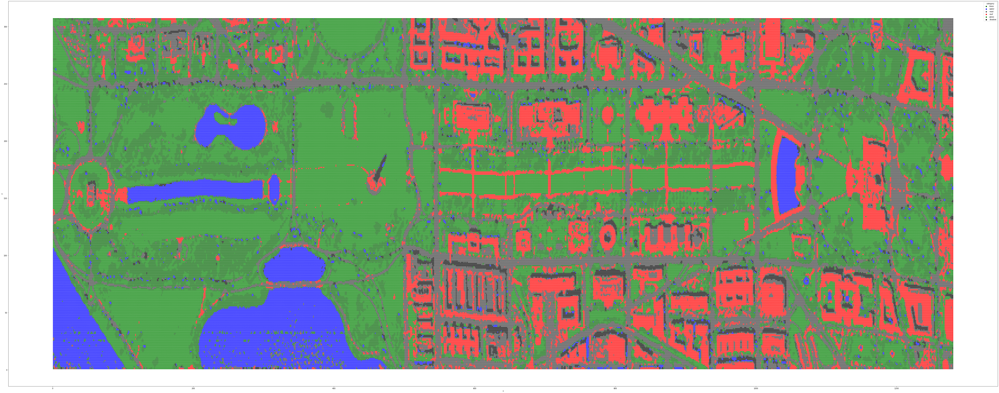

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

with open('ground_truth.pkl', 'rb') as f:
    labelsAll = pickle.load(f)
plt.figure(figsize=(100, 40))
sns.scatterplot(data=labelsAll, x="x", y="y", hue="category", palette= {
    "trees": "darkgreen",
    "road" : "#3D3D3D",
    "roof" : "red",
    "shadow" : "black",
    "water" : "blue",
    "grass" : "green"
})

`spectral_data.pkl:`

`x` = de x-coordinaat op basis van de sateliet

`y` = de y-coordinaat op basis van de sateliet

`1-191` = golflengtes van de sateliet.

In [42]:
print(data)
print(data.info())
print(data.describe())

band  x   y     1     2     3     4     5     6     7     8  ...  182  183  \
0     1   1  3007  2785  2709  2751  2612  2633  2559  2372  ...    0    1   
1     1   2  3328  3151  3078  3012  3040  2903  2769  2598  ...    1    1   
2     1   3  3229  3243  3067  3040  3016  2948  2829  2611  ...    2    2   
3     1   4  3250  3186  3049  3036  2949  2936  2823  2586  ...    1    1   
4     1   5  3082  3141  3010  3056  3018  2976  2869  2654  ...    1    0   
..   ..  ..   ...   ...   ...   ...   ...   ...   ...   ...  ...  ...  ...   
995   4  75  3422  3208  3188  3219  3057  3076  2971  2828  ...    1    1   
996   4  76  3347  3129  3146  3093  3089  2974  2892  2651  ...    1    1   
997   4  77  3385  3277  3162  3179  3240  3130  2979  2737  ...    2    1   
998   4  78  3353  3183  3120  3082  2973  2968  2861  2709  ...    0    1   
999   4  79  3375  3324  3253  3206  3033  3115  3040  2783  ...    2    2   

band  184  185  186  187  188  189  190  191  
0       1    0  

In [4]:
import pandas as pd
ground_pd = pd.DataFrame(data)

In [5]:
ground_pd.head()
print(ground_pd.shape)

(1000, 193)


<AxesSubplot:>

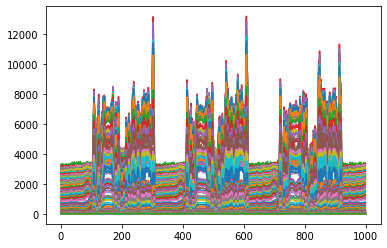

In [6]:
ground_pd.plot(legend=False)

# Data preparation
Voor het trainen van het model hebben we de X en Y as van de ground_truth data neit nodig. 
We gebruiken enkel de category deel van de dataset.

# Modeling
### Modelkeuze: welk model met regularisatie kiezen we? 
We moeten een keuze gaan maken welke vorm van Lasso voor ons geschikt is. Hier is het voornamelijk van belang om te kijken of we bezig zijn met regressie of classificatie. 

In dit geval zijn we bezig met classificatie: is een satteliet sample een 'grass', 'road', 'roof', 'trees', 'water' (5 categorien). Omdat we voor classificatie gaan kiezen we in deze analyse voor geregulariseerde logistische regressie. Het mooie is dat de standaard logistische regressie in sklearn ondersteuning biedt voor lasso (L1 regularisatie):

In [8]:
from sklearn.linear_model import LogisticRegression

base_log_reg = LogisticRegression(penalty='l1', 
                                  multi_class='ovr',
                                  solver='saga',
                                  tol=1e-6,
                                  max_iter=int(1e4), 
                                  C=1).fit(data, labels['category'])
base_log_reg.score(data, labels['category'])

C:\Python39\lib\site-packages\sklearn\utils\validation.py:1858: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Python39\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached w

0.921

0.921 is de accuraatheid van het model

In [9]:
from sklearn.svm import l1_min_c
import numpy as np

cs = l1_min_c(data, labels['category'], loss='log') * np.logspace(0, 7, 16)

In [44]:
np.log10(1/(cs))

array([ 6.24309872,  5.77643205,  5.30976539,  4.84309872,  4.37643205,
        3.90976539,  3.44309872,  2.97643205,  2.50976539,  2.04309872,
        1.57643205,  1.10976539,  0.64309872,  0.17643205, -0.29023461,
       -0.75690128])

### Welke waarde voor de regularisatie kracht geeft de beste performance?
Om voorspellingen met een geregulariseerd model te kunnen maken moeten we een waarde voor de regularisatiekracht kiezen, bij voorkeur een waarde die leidt tot de beste performance. De aanpak om deze waarde te bepalen is als volgt:

- Maak een lijstje met mogelijke regularisatiekracht intstellingen
- Bepaal de performance van deze regularisatiekracht via [crossvalidatie](https://en.wikipedia.org/wiki/Cross-validation_(statistics)), in essentie is dit een train-test-split on steroids. 
- Kies de regularisatiekracht met de beste performance. 

Als eerste moeten we een lijst aan mogelijke regularisatiekracht waardes kiezen:

In [11]:
from sklearn.linear_model import LogisticRegressionCV

cv_result = LogisticRegressionCV(Cs=cs,
                     penalty='l1', 
                     multi_class='ovr',
                     solver='saga',
                     max_iter=int(1e4),
                     n_jobs=-1).fit(data, labels['category'])

C:\Python39\lib\site-packages\sklearn\utils\validation.py:1858: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


In [46]:
print(np.log10(1/(cv_result.C_)))
cv_result.classes_

[ 1.57643205  2.04309872  2.50976539 -0.29023461  2.97643205]


array(['grass', 'road', 'roof', 'trees', 'water'], dtype=object)

De waardes hierboven geeft het optimum aan per grafiek.
Grass: 1,57
road: 2,04
Roof: 2,50
Trees: -0.29
Water: 2.97

We gebruiken hier de l1_min_c functie uit sklearn om de maximale regularisatiekracht te vinden die nog een model oplevert met coefficienten die niet nul zijn. Vanaf dit maximum creeer ik een lijst met 16 opties die steeds minder regularisatiekracht laten zien. Ik heb deze aanpak redelijk 1:1 overgenomen uit de documentatie van l1_min_c.

Nu we onze lijst met mogelijk regularisatiekrachten hebben, moeten we de performance gaan bepalen voor elk van deze opties. Dit doen we doormiddel van de LogisticRegressionCV functie, welke een interface heeft die gelijk is aan LogisticRegression maar met de optie om een lijst met regularisatiekrachten mee te geven. Deze voert dan crossvalidatie uit voor elk van de opties in de lijst, en geeft ons de performance van deze optie. Op deze manier kunnen we de regularisatiekracht kiezen die de beste performance laat zien.

<AxesSubplot:>

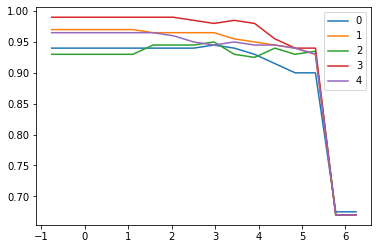

In [14]:
pd.DataFrame(cv_result.scores_['grass'].T, index=np.log10(1/(cs))).plot()

<AxesSubplot:>

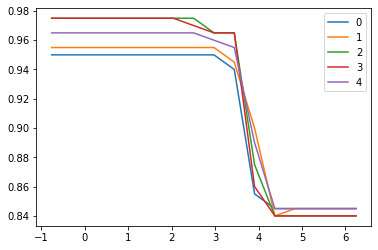

In [15]:
pd.DataFrame(cv_result.scores_['road'].T, index=np.log10(1/(cs))).plot()

<AxesSubplot:>

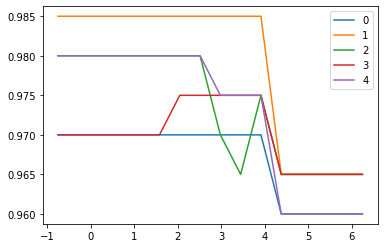

In [16]:
pd.DataFrame(cv_result.scores_['roof'].T, index=np.log10(1/(cs))).plot()

<AxesSubplot:>

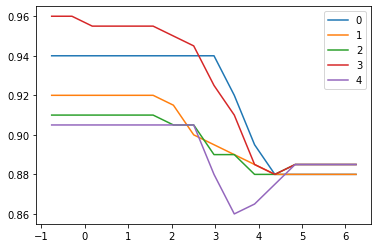

In [17]:
pd.DataFrame(cv_result.scores_['trees'].T, index=np.log10(1/(cs))).plot()

<AxesSubplot:>

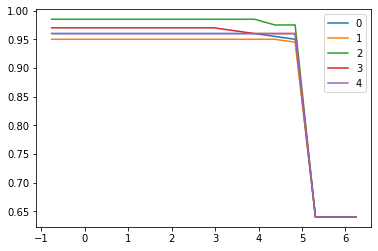

In [18]:
pd.DataFrame(cv_result.scores_['water'].T, index=np.log10(1/(cs))).plot()

In [20]:
predict = cv_result.predict(data)
correct = 0
incorrect = 0
for i in range(1000):
    if(predict[i] != labels['category'][i]):
        incorrect = incorrect + 1
        print("predicted: ", predict[i], " actual: ", labels['category'][i])
    else:
        correct = correct + 1
        
print("correct: ", correct, " incorrect: ", incorrect, " percentage correct: ", (correct/ (1000/100)))

predicted:  water  actual:  trees
predicted:  water  actual:  trees
predicted:  water  actual:  trees
predicted:  water  actual:  road
predicted:  water  actual:  road
predicted:  water  actual:  road
predicted:  water  actual:  roof
predicted:  water  actual:  road
predicted:  road  actual:  trees
predicted:  road  actual:  roof
predicted:  trees  actual:  grass
predicted:  roof  actual:  road
predicted:  road  actual:  roof
predicted:  roof  actual:  grass
predicted:  roof  actual:  grass
predicted:  road  actual:  roof
predicted:  roof  actual:  grass
predicted:  trees  actual:  grass
predicted:  trees  actual:  grass
predicted:  road  actual:  trees
predicted:  road  actual:  trees
predicted:  trees  actual:  grass
predicted:  grass  actual:  trees
predicted:  grass  actual:  trees
predicted:  grass  actual:  trees
predicted:  grass  actual:  trees
predicted:  trees  actual:  grass
predicted:  grass  actual:  trees
predicted:  grass  actual:  trees
predicted:  water  actual:  trees

C:\Python39\lib\site-packages\sklearn\utils\validation.py:1858: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


We kunnen zien dat de accuraatheid van de regressie model redelijk overeenkomt met de daadwerkelijke data.

<AxesSubplot:>

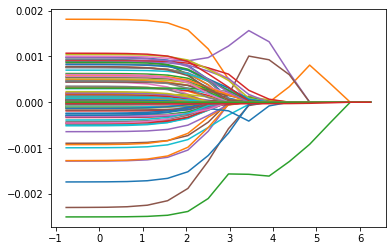

In [28]:
pd.DataFrame(cv_result.coefs_paths_['grass'].mean(axis=0), index=np.log10(1/(cs))).plot(legend=False)

# Evaluation: hoe doet ons sateliet sample model het doet
Dit is eigenlijk moeilijk te zeggen, omdat de dataset te groot is voor dit moment om in zijn volledigheid te analyseren. Doordat we alleen de eerste 1000 rows bekijken is dit geen representatief beeld.

Ook komen we aan de max iteraties, de 1e4 is niet genoeg. Dit gebruiken wij echter op dit moment wel omdat 1e6 te lang duurt om te laden. We kunnen ook niet een kleinere dataset gebruiken, omdat er dan te weinig grass elementen voorkomen om te trainen. De grass elementen komen namelijk later in de dataset voor. Het eerste gedeelte is vooral water.
